## Importing Libraries

In [109]:
# Common imports 
import numpy as np
from pprint import pprint  

# to make this notebook's output stable across runs
np.random.seed(42) 

# sklearn specific imports 
from sklearn.preprocessing import MinMaxScaler ,StandardScaler
from sklearn.pipeline import make_pipeline ,Pipeline
from sklearn.dummy import DummyClassifier 
from sklearn.linear_model  import SGDClassifier, RidgeClassifier, LogisticRegression ,LogisticRegressionCV
from sklearn.model_selection import cross_validate, RandomizedSearchCV,GridSearchCV, cross_val_predict ,learning_curve,train_test_split

from sklearn.neighbors import KNeighborsClassifier

# log loss is also known as cross entropy loss
from sklearn.metrics import log_loss 
from sklearn.metrics import ConfusionMatrixDisplay 
from sklearn.metrics import precision_score, recall_score, classification_report 
from sklearn.metrics import precision_recall_curve ,make_scorer ,f1_score
from sklearn.metrics import roc_curve, roc_auc_score 

#scipy 
from scipy.stats import loguniform 

# To plot pretty figures 
%matplotlib inline 
import matplotlib as mpl 
import matplotlib.colors
import matplotlib.pyplot as plt 
import seaborn as sns;sns.set()

In [3]:
# global settings 
mpl.rc('axes',labelsize=14) 
mpl.rc('xtick',labelsize=12) 
mpl.rc('ytick',labelsize=12) 
mpl.rc('figure',figsize=(8,6))

import warnings 
warnings.filterwarnings('ignore')

### Handwritten Digit Classification Dataset

In [4]:
from sklearn.datasets import fetch_openml
X, y = fetch_openml('mnist_784', version=1, return_X_y=True)

In [5]:
X = X.to_numpy()
y = y.to_numpy()

In [6]:
X_train, X_test, y_train, y_test = X[:60000], X[60000:], y[:60000], y[60000:]

## Softmax Regression on MNIST
- The objective of this notebook is to demonstrate softmax regression in classification task.

- We make use of MNIST dataset for multiclass classification of images into digits they represent.

### Model Building
We scale the input features with `StandardScaler` and use `LogisticRegression` estimator with **multi_class set to `multinomial`** and using **`sag` solver**.

In [8]:
pipe = Pipeline([('scaler',StandardScaler()),
                 ('logreg',LogisticRegression(multi_class='multinomial',solver='sag'))]) 
                 
pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('logreg',
                 LogisticRegression(multi_class='multinomial', solver='sag'))])

In [9]:
pipe.score(X_train,y_train)

0.9305833333333333

In [10]:
pipe.score(X_test,y_test)

0.9249

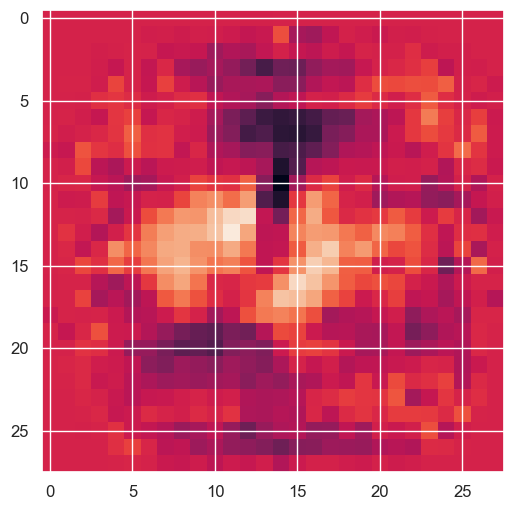

In [11]:
image = pipe[-1].coef_[4].reshape(28, 28)
plt.imshow(image)

In [12]:
pipe[-1].coef_.shape

(10, 784)

In [13]:
pipe[-1].intercept_.shape

(10,)

In [14]:
pipe[-1].classes_

array(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'], dtype=object)

### Model Evaluation

In [16]:
print(classification_report(y_test ,pipe.predict(X_test)))

              precision    recall  f1-score   support

           0       0.95      0.98      0.97       980
           1       0.96      0.98      0.97      1135
           2       0.94      0.90      0.92      1032
           3       0.91      0.91      0.91      1010
           4       0.92      0.94      0.93       982
           5       0.91      0.87      0.89       892
           6       0.93      0.95      0.94       958
           7       0.92      0.93      0.92      1028
           8       0.88      0.88      0.88       974
           9       0.91      0.91      0.91      1009

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000



Most of the classses have `f1_score` greater than 90%, which is considered to be a good f1_score.

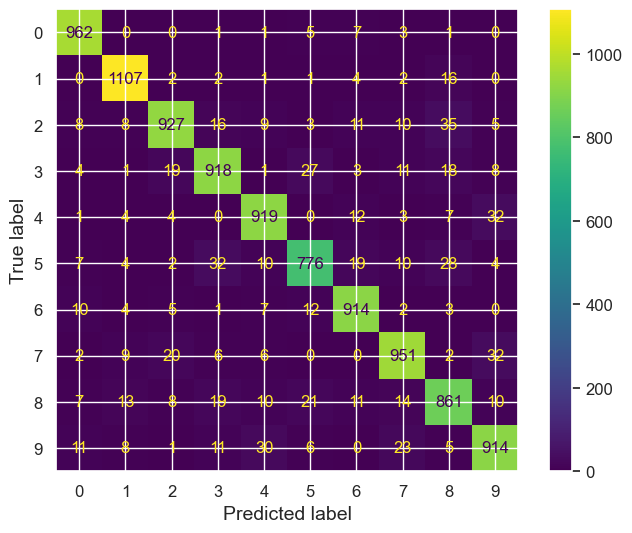

In [17]:
ConfusionMatrixDisplay.from_estimator(pipe, X_test, y_test)
plt.show()

## Using LogisticRegressionCV

In [18]:
X_tr, X_te, y_tr, y_te = X[:10000], X[10000:10500], y[:10000], y[10000:10500]

In [19]:
scorer = make_scorer(f1_score, average='micro')

pipe = Pipeline([('scaler', StandardScaler()),
                 ('logreg', LogisticRegressionCV(cv=3,
                                                 multi_class='multinomial', solver='sag',
                                                 scoring=scorer, max_iter=100, random_state=1729))])

**Note** : takes quite a while to finish training (almost 10 mins)

In [20]:
pipe.fit(X_tr,y_tr)

Pipeline(steps=[('scaler', StandardScaler()),
                ('logreg',
                 LogisticRegressionCV(cv=3, multi_class='multinomial',
                                      random_state=1729,
                                      scoring=make_scorer(f1_score, average=micro),
                                      solver='sag'))])

### Learning the model parameters.

In [21]:
pipe[-1].C_

array([0.04641589, 0.04641589, 0.04641589, 0.04641589, 0.04641589,
       0.04641589, 0.04641589, 0.04641589, 0.04641589, 0.04641589])

In [22]:
pipe[-1].l1_ratio_

array([None, None, None, None, None, None, None, None, None, None],
      dtype=object)

### Model Evaluation

In [23]:
print(classification_report(y_te ,pipe.predict(X_te)))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98        56
           1       0.92      0.95      0.93        57
           2       0.92      0.94      0.93        51
           3       0.94      0.94      0.94        49
           4       0.91      0.93      0.92        46
           5       0.98      0.91      0.94        46
           6       0.90      0.90      0.90        50
           7       0.98      0.96      0.97        51
           8       0.72      0.78      0.75        40
           9       1.00      0.94      0.97        54

    accuracy                           0.93       500
   macro avg       0.93      0.92      0.92       500
weighted avg       0.93      0.93      0.93       500



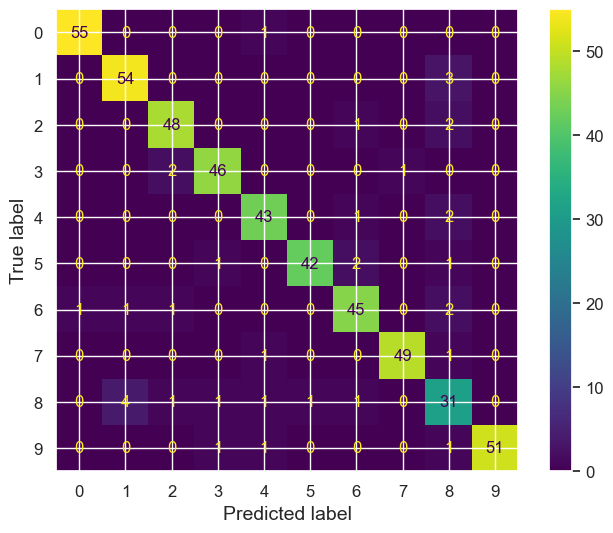

In [24]:
ConfusionMatrixDisplay.from_estimator(pipe, X_te, y_te)
plt.show()

# KNN Classification

- It is a type of `instance-based` learning or `non-generalizing` learning
   - does not attempt to construct a model 
   - simply stores instances of the training data<br><br>

- Classification is computed from a `simple majority vote (mode)`of the nearest neighbors of each point.<br><br>

- Two different implementations of nearest neighbors classifiers areavailable.
  1. KNeighborsClassifier
  2. RadiusNeighborsClassifier

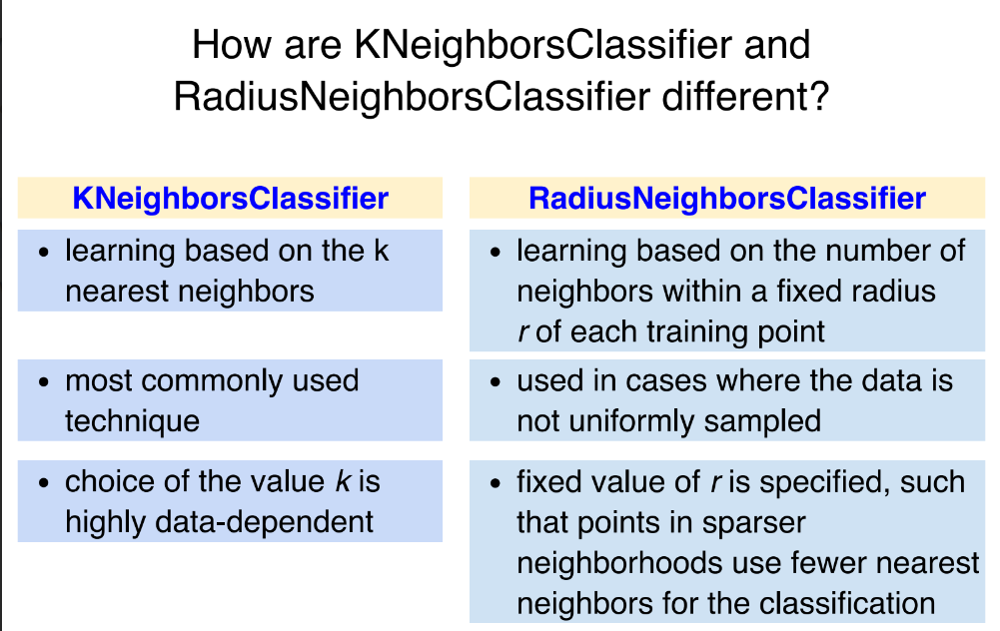

### How do you apply `KNeighborsClassifier`?

- **Step 1**: Instantiate a **`KNeighborsClassifer`** estimator without passing any arguments to it to create a classifer object.
- **Step 2**: Call fit method on KNeighborsClassifier object with training feature matrix and label vector as arguments.    
- Specify the number of `nearest neighbors K` from the training dataset using **`n_neighbors`** parameter, value should be `int`.

> **kneighbor_classifier = KNeighborsClassifier(n_neighbors = 3)**

**Default value: n_neighbors = 5**

### How do you assign weights to neighborhood in KNeighborsClassifier?
- It is better to weight the neighbors such that nearer neighbors contribute more to the fit.
Use parameter **`weights`** that takes in two values :
   1. `uniform` : All points in each neighborhood are weighted equally. **(It is Default value for weight)**
   2. `distance` : weight points by the inverse of their distance. (closer neighbors of a query point will have a greater influence than neighbors which are further away.)    
        
#### We define our own weight values for KNeighborsClassifier
- Yes, it is possible if you have an array of distances.

- **`weights`** parameter also accepts a user-defined function which takes an array of distances as input, and returns an array of the same shape containing the weights.

> **def user_weights(weights_array):<br>
               return weights_array<br><br>               
kneighbor_classifier = KNeighborsClassifier(weights=user_weights)**

### Which algorithm is used to compute the nearest neighbors in KNeighborsClassifier?

We can use **`algorithm`** parameter which takes in the following values :
   1. ‘ball_tree’ will use BallTree
   2. ‘kd_tree’ will use KDTree
   3. ‘brute’ will use a brute-force search
   4. ‘auto’ will attempt to decide the most appropriate algorithm based on the values passed to the fit method.**(It is Default value for algorithm)**

### Some additional parmeters for tree algorithm in KNeighborsClassifier
- For **'ball_tree' and 'kd_tree'** algorithms, there are some other parameters to be set.

1. leaf_size : 
    1. can affect the speed of the construction and query, as well as the memory required to store the tree 
    2. default = 30
    
2. metric :
    1. Distance metric to use for the tree
    2. It is either string or callable function 
    - some metrics are listed below: “euclidean”, “manhattan”, “chebyshev”, “minkowski”, “wminkowski”, “seuclidean”, “mahalanobis”
        - default = 'minkowski'

3. p : 
   1. Power parameter for the Minkowski metric.
   2. default = 2

### How do you apply `RadiusNeighborsClassifier`?

- **Step 1**: Instantiate a **`RadiusNeighborsClassifier`** estimator without passing any arguments to it to create a classifer object.
- **Step 2**: Call fit method on RadiusNeighborsClassifier object with training feature matrix and label vector as arguments.    
- The number of neighbors is specified within a **fixed radius r** of each training point using **`radius`** parameter.**(radius is a float value & Default is 1.0)**


*REST PARAMETERS ARE SAME AS THAT OF `KNEIGHBOURSCLASSIFIER`*


### Binary Classification

#### Changing labels to binary

> **Let us do binary classification with KNN classifier and eventually extend it to Multiclass setup.**

In [25]:
# initialize new variable names with all -1
y_train_0 = -1*np.ones(len(y_train))
y_test_0 = -1*np.ones(len(y_test))

# find indices of digit 0 image
indx_0 = np.where(y_train == '0')

# remember original labels are of type str not int, so use those indices to modify y_train_0 & y_test_0

y_train_0[indx_0] = 1
indx_0 = np.where(y_test == '0')
y_test_0[indx_0] = 1

### Data Visualization in Lower Dimensions

Let us apply PCA on the datapoints and reduce the dimensions to 2D and then to 3D.

This will give us some rough idea about the points in 

One interesting thing to look at is the change in the magnitude of the data points before and after applying PCA.

In [26]:
from sklearn.decomposition import PCA

pipe_pca_2d = make_pipeline(MinMaxScaler(), PCA(n_components=2))
X_train_pca_2d = pipe_pca_2d.fit_transform(X_train)

### Visualization of the 2D data obtained through PCA

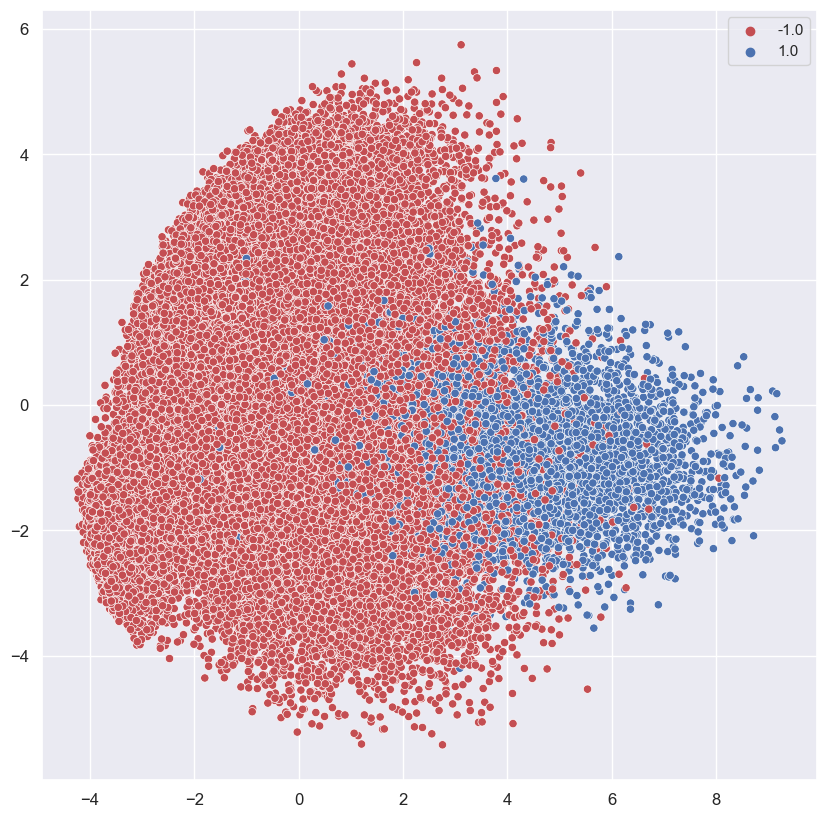

In [27]:
plt.figure(figsize=(10, 10))
cmap = matplotlib.colors.ListedColormap(['r', 'b'])
sns.scatterplot(x=X_train_pca_2d[:, 0], y=X_train_pca_2d[:, 1],
                data=X_train_pca_2d, hue=y_train_0, palette=cmap)
plt.show()

### Projection in 3D using PCA

In [28]:
pipe_pca_3d = make_pipeline(MinMaxScaler() ,PCA(n_components=3))
X_train_pca_3d = pipe_pca_3d.fit_transform(X_train)

import plotly.express as px 

cmap = matplotlib.colors.ListedColormap(['r', 'b'])

fig = px.scatter_3d(x=X_train_pca_3d[:,0],
                    y=X_train_pca_3d[:,1],
                    z=X_train_pca_3d[:,2],
                    color=y_train_0, 
                    color_discrete_map=cmap,
                    opacity=0.5)

fig.show()

## KNN classifier

### Algorithm :

1. Set `k` to desired value i.e. how many neighbors should be allowed to participate in prediction.

2. Calculate the distance between the new example and every example from the data. Thus, creating a distance vector.

3. Get indices of nearest `k` neighbors.

4. Get the labels of the selected `k` entries.

5. If it is a classification task, return the majority class by computing mode of `k` labels.

To understand the working of sklearn built-in function, we first create a KNN classifier model with `k=3` and consider a smaller number of samples of training and test set.
- The `KNeighborsClassifer` creates a classifier instance.
- There are many optional arguments such as `n_neighbors`, `metric`, `weights`, .... that can be set to suitable values while creating an instance.

Creating a new pipeline for classifier :
   - We use the variables `pipe_pca_2d` for preprocessing the samples alone and `pipe_clf_pca_2d` for classification.

In [29]:
pipe_clf_pca_2d = make_pipeline(pipe_pca_2d, KNeighborsClassifier(n_neighbors=3))

Let us train the model with 10 samples from training set (i.e. we are just putting 10 datapoints in the metric space, not building any parameterized model)

Then test the model with 10 datapoints from test set.

In [70]:
# Train 10 samples (first 5 from negative class and last 5 from positive class)
index_neg = np.argsort(y_train_0)[:5]
index_pos = np.argsort(y_train_0)[-1:-6:-1]
print(f"Positive classes: {y_train_0[index_pos]}")
print(f"Negative classes: {y_train_0[index_neg]}")     

Positive classes: [1. 1. 1. 1. 1.]
Negative classes: [-1. -1. -1. -1. -1.]


In [74]:
# create a small dataset
x = np.vstack((X_train[index_pos, :], X_train[index_neg, :]))
y = np.hstack((y_train_0[index_pos], y_train_0[index_neg]))

x

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [67]:
y

array([ 1.,  1.,  1.,  1.,  1., -1., -1., -1., -1., -1.])

In [78]:
pipe_clf_pca_2d.fit(x,y)

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                                 ('pca', PCA(n_components=2))])),
                ('kneighborsclassifier', KNeighborsClassifier(n_neighbors=3))])

In [79]:
# for visulization
x_reduced = pipe_clf_pca_2d[0].transform(x)

In [80]:
x_reduced

array([[ 5.73690681, -1.63929569],
       [-2.69666998,  0.72998881],
       [ 4.20928173, -2.53916005],
       [ 6.24095453,  6.10300765],
       [-3.57562474,  0.60503617],
       [-2.65942223,  2.18235938],
       [-4.43748769, -1.31200256],
       [-1.6221111 , -3.07898506],
       [ 1.86857222, -4.47951235],
       [-3.06439955,  3.4285637 ]])

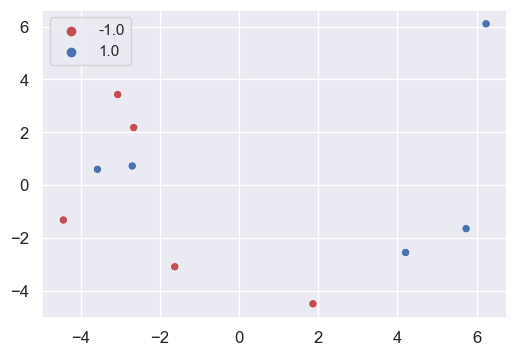

In [81]:
plt.figure(figsize=(6, 4))
sns.scatterplot(x=x_reduced[:, 0], y=x_reduced[:, 1],
                hue=y, marker='o', palette=['r', 'b'])
plt.grid(True)
plt.show()

In [82]:
y_hat_0 = pipe_clf_pca_2d.predict(X_test[:10,:])

print('Test label : ',y_test_0[:10])
print('Predicted Label : ',y_hat_0[:10])

Test label :  [-1. -1. -1.  1. -1. -1. -1. -1. -1. -1.]
Predicted Label :  [ 1. -1.  1.  1. -1.  1. -1. -1.  1.  1.]


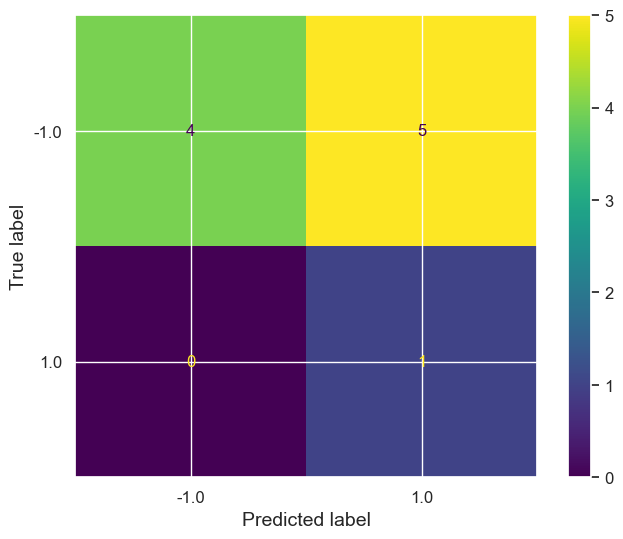

In [83]:
ConfusionMatrixDisplay.from_predictions(y_test_0[:10],y_hat_0)


**Observe that** :

We can see that there are more FP's (as 9 out 10 actual labels are negative)

Let us display both the training points and testing points with their predictions.

We can visually validate the reason behind the performance.

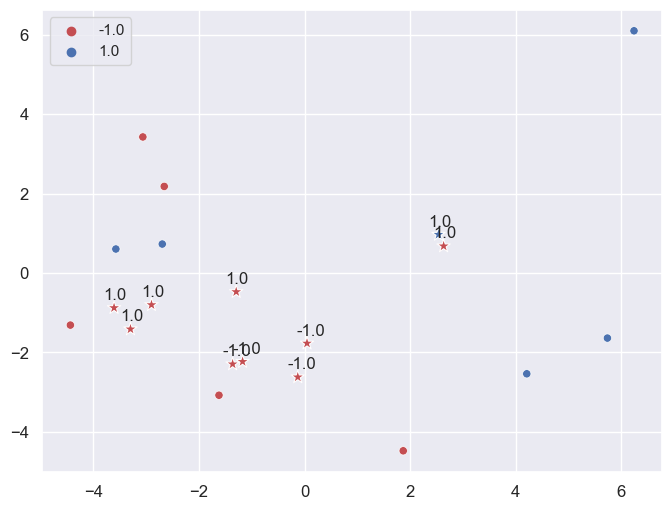

In [37]:
cmap = matplotlib.colors.ListedColormap(['r', 'b'])

plt.figure(figsize=(8, 6))
sns.scatterplot(x=x_reduced[:, 0], y=x_reduced[:, 1],
                marker='o', hue=y, palette=cmap)

x_test_reduced = pipe_clf_pca_2d[0].transform(X_test[:10, :])
sns.scatterplot(x=x_test_reduced[:, 0], y=x_test_reduced[:, 1],
                s=100, marker='*', hue=y_test_0[:10], palette=cmap, legend=None)

dx, dy = -0.2, 0.2
for i in range(10):
    plt.annotate(str(y_hat_0[i]), xy=(x_test_reduced[i, 0]+dx, x_test_reduced[i, 1]+dy))

plt.grid(True)
plt.show()

It would be much better if we know the distance of 3 neighbors for each testing points.

Let us display the distance and connnectivity of neighbors to the test datapoints using th class `NearestNeighbors`.

In fact, `KNeighborsClassifier` calls `NearestNeighbors` class internally to compute all these distances.

In [38]:
from sklearn.neighbors import NearestNeighbors

neighbors = NearestNeighbors(n_neighbors=3)
neighbors.fit(pipe_pca_2d.transform(x))

NearestNeighbors(n_neighbors=3)

which are the first three closest neighbors to the first three in the test set. And how close are they?

In [40]:
dist_neighbors, idx_neighbors = neighbors.kneighbors(pipe_pca_2d.transform(X_test[:10]), 3, return_distance=True)

In [41]:
import statistics

for i in range(3):
    print('Distance : {0} \nIndex : {1} \nLabels : {2} \nPrediction : {3}'.format(dist_neighbors[i],idx_neighbors[i],y[idx_neighbors[i].flatten()],
    statistics.mode(y[idx_neighbors[i].flatten()])))

    print('-'*20)

Distance : [1.54510433 1.56004731 1.61914472] 
Index : [1 4 6] 
Labels : [ 1.  1. -1.] 
Prediction : 1.0
--------------------
Distance : [0.95703587 3.33077652 3.39001596] 
Index : [7 1 6] 
Labels : [-1.  1. -1.] 
Prediction : -1.0
--------------------
Distance : [1.14297879 2.0379748  2.22709669] 
Index : [6 4 1] 
Labels : [-1.  1.  1.] 
Prediction : 1.0
--------------------


Let us train the model with 10000 samples from training set (i.e. we are just putting 10000 datapoints in the metric space, not building any parameterized model).

In [84]:
pipe_clf_pca_2d.fit(X_train[:10000],y_train_0[:10000]) 

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                                 ('pca', PCA(n_components=2))])),
                ('kneighborsclassifier', KNeighborsClassifier(n_neighbors=3))])

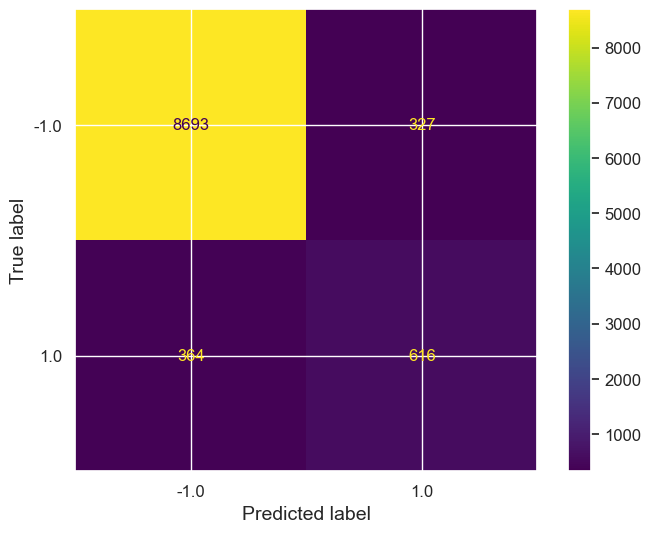

In [85]:
y_hat_0 = pipe_clf_pca_2d.predict(X_test)

ConfusionMatrixDisplay.from_predictions(y_test_0, y_hat_0)
plt.show()

In [45]:
print(classification_report(y_test_0,y_hat_0))

              precision    recall  f1-score   support

        -1.0       0.96      0.96      0.96      9020
         1.0       0.65      0.63      0.64       980

    accuracy                           0.93     10000
   macro avg       0.81      0.80      0.80     10000
weighted avg       0.93      0.93      0.93     10000



- Let's vary the n_neighbours from k=1 to 19 and study the performance of the model.

- We use the first 10000 samples from training set.

In [86]:
precision=[] 

for k in range(1,20,2):
    pipe_clf_pca_2d.__n_neighbors=k 
    pipe_clf_pca_2d.fit(X_train[:10000],y_train_0[:10000]) 
    
    y_hat_0 = pipe_clf_pca_2d.predict(X_test) 
    precision.append(precision_score(y_test_0,y_hat_0))

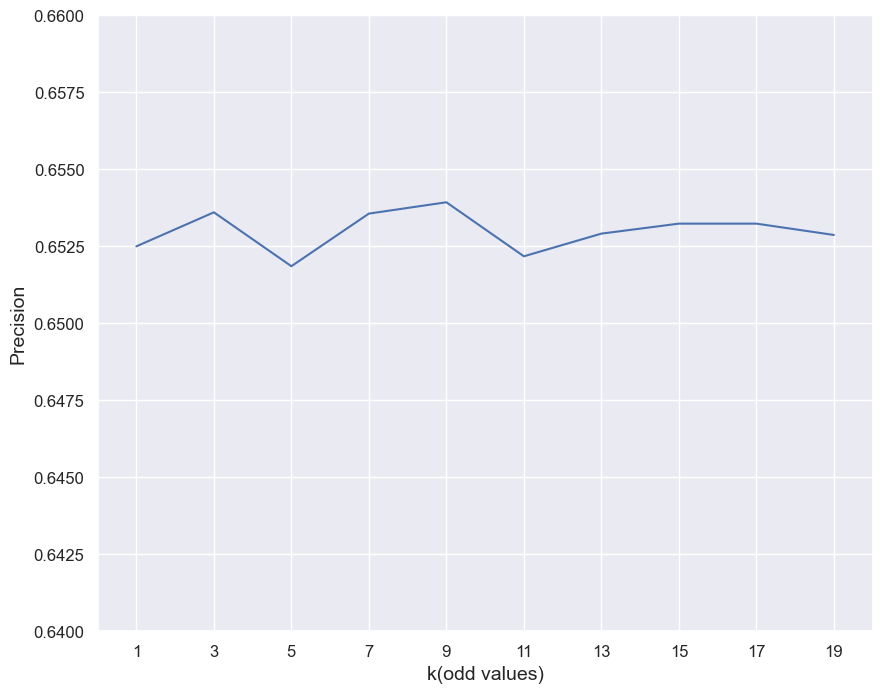

In [87]:
plt.figure(figsize=(10, 8))
plt.plot(np.arange(1, 20, 2), precision)

plt.xlim((0, 20))
plt.ylim((0.64, 0.66))
plt.xlabel('k(odd values)')
plt.ylabel('Precision')

plt.xticks(ticks=np.arange(1, 20, 2), labels=np.arange(1, 20, 2))
plt.grid(True)
plt.show()

## Going without PCA

- Let us use KNN classifier **with all the features** in the training samples with the hope that it **increases the performance** of the model (of course at the cost of computation)

- Let's search for k by using cross validation.

- **NOTE** : It takes about 4 minutes for entire computation.

In [88]:
pipe_knn = make_pipeline(MinMaxScaler(),
                         KNeighborsClassifier(n_neighbors=1))

In [89]:
grid_k = {'kneighborsclassifier__n_neighbors': [1, 3, 5, 7, 9, 11]}

cv = GridSearchCV(pipe_knn, param_grid=grid_k, scoring='precision', cv=5,n_jobs=1)

In [90]:
cv.fit(X_train, y_train_0)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                                       ('kneighborsclassifier',
                                        KNeighborsClassifier(n_neighbors=1))]),
             n_jobs=1,
             param_grid={'kneighborsclassifier__n_neighbors': [1, 3, 5, 7, 9,
                                                               11]},
             scoring='precision')

In [91]:
pprint(cv)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                                       ('kneighborsclassifier',
                                        KNeighborsClassifier(n_neighbors=1))]),
             n_jobs=1,
             param_grid={'kneighborsclassifier__n_neighbors': [1, 3, 5, 7, 9,
                                                               11]},
             scoring='precision')


In [95]:
pprint(cv.cv_results_)

{'mean_fit_time': array([0.74234271, 0.59937172, 0.57984343, 0.57853804, 0.5927578 ,
       0.59070525]),
 'mean_score_time': array([7.45472393, 7.44112158, 7.50329571, 7.46898837, 7.58456731,
       7.64603615]),
 'mean_test_score': array([0.97805545, 0.98229094, 0.98212333, 0.98245498, 0.98111657,
       0.98078408]),
 'param_kneighborsclassifier__n_neighbors': masked_array(data=[1, 3, 5, 7, 9, 11],
             mask=[False, False, False, False, False, False],
       fill_value='?',
            dtype=object),
 'params': [{'kneighborsclassifier__n_neighbors': 1},
            {'kneighborsclassifier__n_neighbors': 3},
            {'kneighborsclassifier__n_neighbors': 5},
            {'kneighborsclassifier__n_neighbors': 7},
            {'kneighborsclassifier__n_neighbors': 9},
            {'kneighborsclassifier__n_neighbors': 11}],
 'rank_test_score': array([6, 2, 3, 1, 4, 5]),
 'split0_test_score': array([0.97920133, 0.98493724, 0.98166667, 0.98086522, 0.97921862,
       0.97921862]),


In [102]:
cv.best_estimator_

Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                ('kneighborsclassifier', KNeighborsClassifier(n_neighbors=7))])

**The best value obtained for k is 7. (check in test_rank_score)**

## Multiclass Classification

Extending KNN classifier to mulitclass classification is pretty simple straightforward.

In [93]:
pipe_knn = make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=7))
pipe_knn.fit(X_train,y_train)

Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                ('kneighborsclassifier', KNeighborsClassifier(n_neighbors=7))])

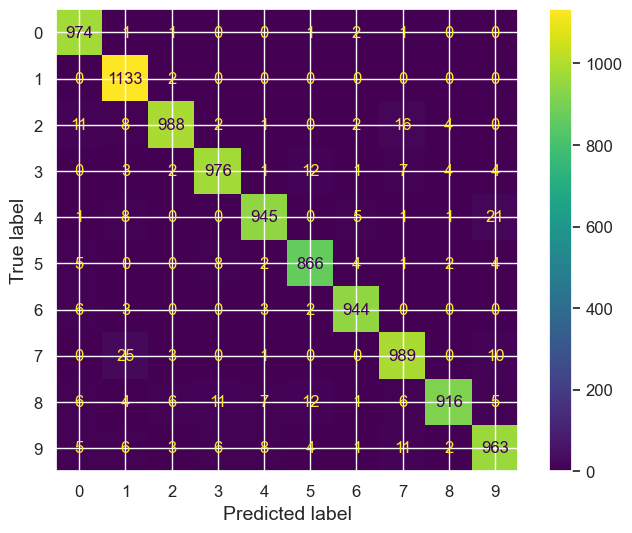

In [94]:
y_hat_0 = pipe_knn.predict(X_test)

ConfusionMatrixDisplay.from_predictions(y_test, y_hat_0)
plt.show()

In [97]:
pprint(pipe_knn)

Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                ('kneighborsclassifier', KNeighborsClassifier(n_neighbors=7))])


In [99]:
pipe_knn.classes_

array(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'], dtype=object)

In [103]:
print(classification_report(y_test, y_hat))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       980
           1       0.95      1.00      0.97      1135
           2       0.98      0.96      0.97      1032
           3       0.97      0.97      0.97      1010
           4       0.98      0.96      0.97       982
           5       0.97      0.97      0.97       892
           6       0.98      0.99      0.98       958
           7       0.96      0.96      0.96      1028
           8       0.99      0.94      0.96       974
           9       0.96      0.95      0.96      1009

    accuracy                           0.97     10000
   macro avg       0.97      0.97      0.97     10000
weighted avg       0.97      0.97      0.97     10000



### KNeighborsRegressor on California-Housing Dataset

We know that k-NN can be used in addressing regressing problems.

In this notebook, we will demonstrate the use of **k-NN in regression** setup with **California housing dataset**, where we try to predict price of a house based on its features.

In [126]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error

### **STEP 1 : Training Data**



#### **Loading the dataset**

This dataset can be fetched from sklearn with `fetch_california_housing` API.

In [117]:
from sklearn.datasets import fetch_california_housing
X,y = fetch_california_housing(return_X_y=True)

Lets check the shape of feature matrix and label vector.

In [118]:
print('Shape of feature matrix : ' ,X.shape)
print('Shape of label vector : ',y.shape)

Shape of feature matrix :  (20640, 8)
Shape of label vector :  (20640,)


Perform quick sanity check to make sure  we have same number of rows in the feature matrix as well as the label vector.

In [ ]:
assert(X.shape[0] == y.shape[0])

#### **Split data into train & test sets**

In [120]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.30, random_state=8) 

In [121]:
print('Shape of training feature matrix : ' ,X_train.shape)
print('Shape of training label vector : ',y_train.shape)
print()
print('Shape of test feature matrix : ' ,X_test.shape)
print('Shape of test label vector : ',y_test.shape)

Shape of training feature matrix :  (14448, 8)
Shape of training label vector :  (14448,)

Shape of test feature matrix :  (6192, 8)
Shape of test label vector :  (6192,)


In [122]:
assert(X_train.shape[0] == y_train.shape[0])
assert(X_test.shape[0] == y_test.shape[0])

#### **Preprocessing the dataset**

We have explored California housing set in detail earlier in the course 

In order to refresh your memory, we have bargraphs corresponding to all the features and the output label plotted here.

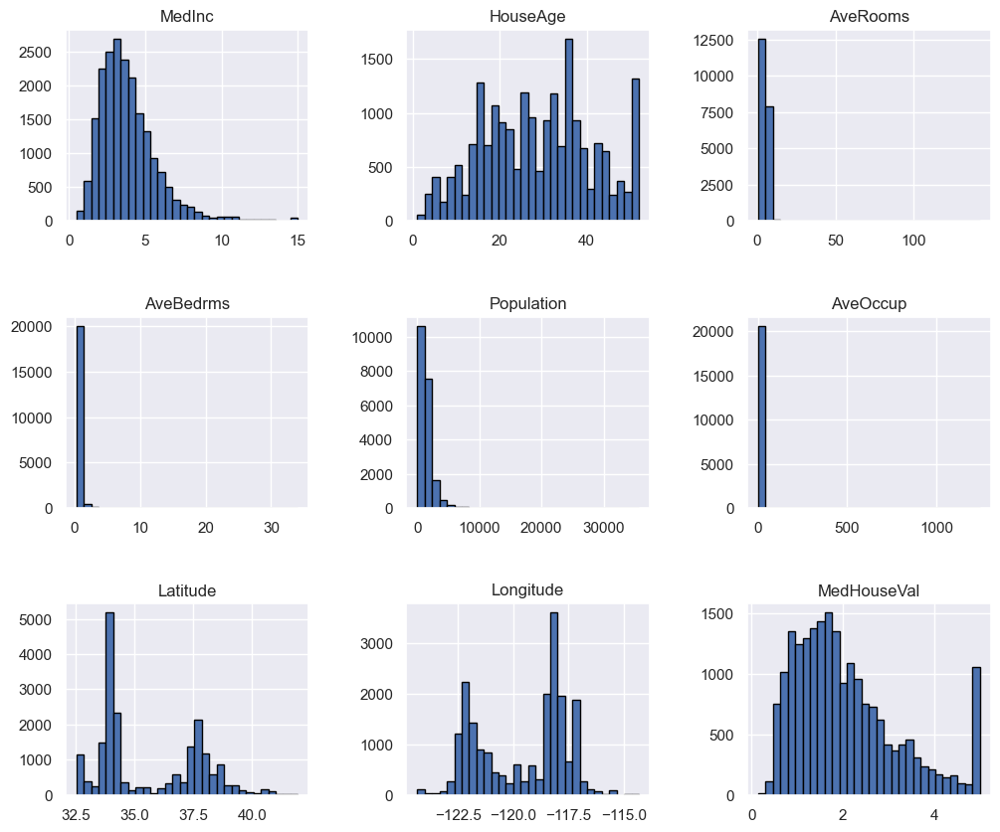

In [123]:
california_housing = fetch_california_housing(as_frame=True)

california_housing.frame.hist(figsize=(12, 10), bins=30, edgecolor="black")
plt.subplots_adjust(hspace=0.5, wspace=0.4)

**Observe that :**

* The features are on a different scale and we need to bring them on the same scale for k-NN. 

* k-NN uses Euclidean distance computation to identify the nearest neighbors to identify the nearest neighbors and it is crucial to have all the features on the same scale for that. 

* If all the features are not on the same scale, the feature with wider variance would dominate the distance calculation.

### **STEP 2 : Model Building**

We instantiate a `pipeline` object with two stages; 

* The first stage performs feature scaling with `MinMaxScaler`.

* And the second stage performs k-NN regressor with `n_neighbors=2`. In short, we are using 2-NN that is we use the price of the two nearest houses in feature space to decide the price of the new house.

* The model is trained with feature matrix and label vector from training set.

* After the model is trained, it is evaluated with the test set using the `mean squared error` metric.


In [124]:
pipe = Pipeline([('scaler', MinMaxScaler()),
                 ('knn', KNeighborsRegressor(n_neighbors=2))])

pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('knn', KNeighborsRegressor(n_neighbors=2))])

In [128]:
y_pred = pipe.predict(X_test)

error = mean_squared_error(y_test, y_pred, squared=False)
print(error)

0.6767822465759739


### **STEP 3: Model Selection and Evaluation** 

k-NN classifier has $k$, the number of neighbors, as a hyperparameter.

There are a couple of ways to tune the hyper-parameter 
  1. Manual hyper-parameter tuning

  2. Using `GridSearchCV` or `RandomizedSearchCV`. 

We will demonstrate both **Manual** as well as **Grid-Search** based hyperparameter tuning.


#### 3.A. **Manual HPT with cross-validation** 

Here we train and evaluate the model pipeline with different values of k-1 to 31.

In [129]:
rmse_val = []

for K in range(1, 31):
    pipe = Pipeline([('scaler', MinMaxScaler()),
                    ('knn', KNeighborsRegressor(n_neighbors=K))])

    # fit the model
    pipe.fit(X_train, y_train)

    # make prediction on test set
    pred = pipe.predict(X_test)

    # calculate rmse
    error = mean_squared_error(y_test, pred, squared=False)

    # store rmse values
    rmse_val.append(error)

At the end of this loop, we get a list of RMSEs-one for each value of k.

We plot the learning curve with **$k$ on x-axis** and **RMSE on y-axis**.

The  value of k that results in the **lowest RMSE is the best value of k** that we select.

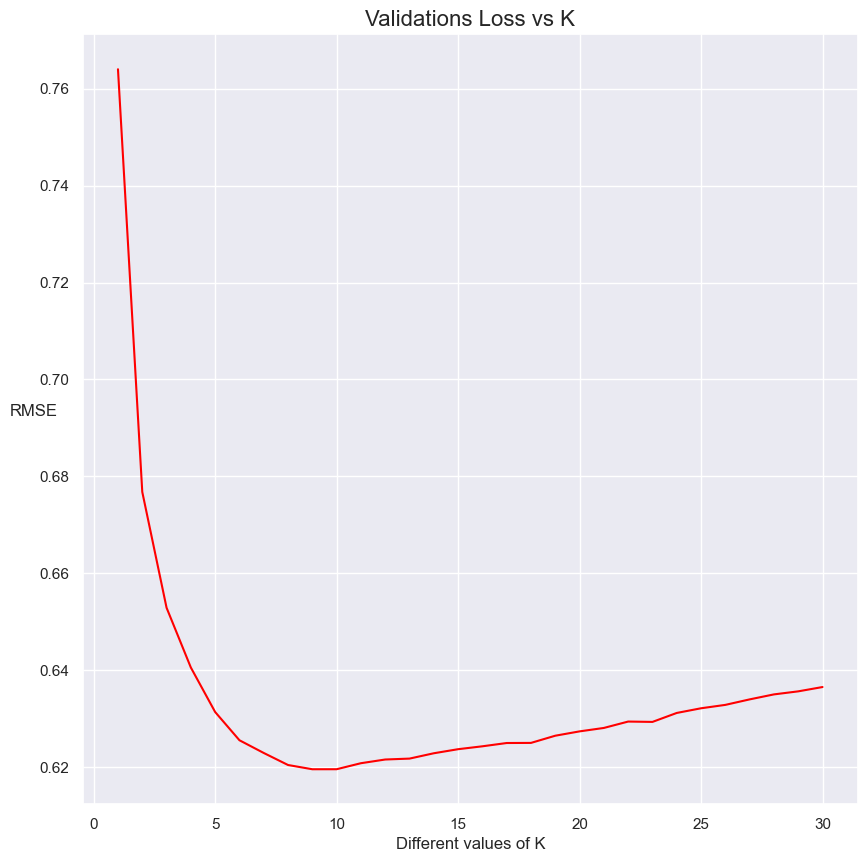

In [130]:
plt.figure(figsize=(10, 10))
plt.plot(range(1, len(rmse_val)+1), rmse_val, color='red')

plt.xlabel('Different values of K', fontsize=12)
plt.ylabel('RMSE', fontsize=12, rotation=0)
plt.grid(True)

plt.title('Validations Loss vs K', fontsize=16)
plt.show()

In [131]:
rmse_val.index((min(rmse_val)))

8

#### 3.B. **HPT with GridSearchCV**

* We set up the parameter grid for values of k of our interest.

* Here we use the values between 1 and 31.

* The object of `GridSearchCV` is instantiated with a `KNeighborsRegressor` estimator along with the parameter grid and number of cross-validation folds equal to 10.

* The grid search is performed by calling the `fit` method with training feature matrix and labels as arguments.

In [132]:
param_grid = {'knn__n_neighbors': list(range(1,31))} 

pipe = Pipeline([('scaler',MinMaxScaler()),
                 ('knn',KNeighborsRegressor())
                ])

In [133]:
gs = GridSearchCV(pipe,param_grid = param_grid,
                  cv =10,
                  n_jobs=1,
                  return_train_score=True) 

gs.fit(X_train,y_train) 

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', MinMaxScaler()),
                                       ('knn', KNeighborsRegressor())]),
             n_jobs=1,
             param_grid={'knn__n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
                                              12, 13, 14, 15, 16, 17, 18, 19,
                                              20, 21, 22, 23, 24, 25, 26, 27,
                                              28, 29, 30]},
             return_train_score=True)

Lets evaluate the best estimator on the test set.

In [134]:
gs.best_estimator_

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('knn', KNeighborsRegressor(n_neighbors=6))])

In [135]:
gs.best_params_

{'knn__n_neighbors': 6}

Making predictions on the test set

In [136]:
y_pred = gs.best_estimator_.predict(X_test)
mean_squared_error(y_test,y_pred,squared=False)

0.6255268557053962

#### 3.C. **HPT with RandmizedSearchCV**

In [137]:
param_grid = {'knn__n_neighbors': list(range(1,31))} 

pipe = Pipeline([('scaler',MinMaxScaler()),
                 ('knn',KNeighborsRegressor())
                ]) 

In [138]:
rs = RandomizedSearchCV(pipe, param_distributions=param_grid,
                      n_jobs=1,refit=True, cv=10,
                      return_train_score=True) 

rs.fit(X_train,y_train) 

RandomizedSearchCV(cv=10,
                   estimator=Pipeline(steps=[('scaler', MinMaxScaler()),
                                             ('knn', KNeighborsRegressor())]),
                   n_jobs=1,
                   param_distributions={'knn__n_neighbors': [1, 2, 3, 4, 5, 6,
                                                             7, 8, 9, 10, 11,
                                                             12, 13, 14, 15, 16,
                                                             17, 18, 19, 20, 21,
                                                             22, 23, 24, 25, 26,
                                                             27, 28, 29, 30]},
                   return_train_score=True)

Lets evaluate the best estimator on the test set.

In [139]:
rs.best_estimator_

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('knn', KNeighborsRegressor(n_neighbors=9))])

In [140]:
rs.best_params_

{'knn__n_neighbors': 9}

Making predictions on the test set

In [141]:
y_pred = rs.best_estimator_.predict(X_test)
mean_squared_error(y_test,y_pred,squared=False)

0.6195418732794183

#### 3.D. **GridSearchCV + Polynomial Features**

In addition, we perform polynomial transformation on the features followed by scaling before using it in the nearest neighbor regressor.

In [144]:
from sklearn.preprocessing import PolynomialFeatures
params = {'poly__degree': list(range(1, 4))}

pipe = Pipeline([('poly', PolynomialFeatures()),
                 ('scaler', MinMaxScaler()),
                 ('knn', KNeighborsRegressor())])

gs_poly = GridSearchCV(estimator=pipe,
                  param_grid=params,
                  cv=10,
                  n_jobs=1)


In [145]:
gs_poly.fit(X_train, y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('poly', PolynomialFeatures()),
                                       ('scaler', MinMaxScaler()),
                                       ('knn', KNeighborsRegressor())]),
             n_jobs=1, param_grid={'poly__degree': [1, 2, 3]})

In [146]:
gs_poly.best_estimator_

Pipeline(steps=[('poly', PolynomialFeatures(degree=1)),
                ('scaler', MinMaxScaler()), ('knn', KNeighborsRegressor())])

We evaluate the model with the test set.

In [1]:
y_pred = gs_poly.best_estimator_.predict(X_test)
error = mean_squared_error(y_test, y_pred, squared=False)

print('RMSE value of k is :', error)

NameError: name 'gs_poly' is not defined

# Support Vector Classifiers

## Support Vector Machines

**Watch [https://youtu.be/efR1C6CvhmE?si=Rip8qkBWGP2zpHSa] for better understanding !!**

- Support Vector Machines (SVM) are a set of supervised learning methods used for classification, regression and outliers
detection.
- SVM constructs a hyper-plane or set of hyper-planes in a high or infinite dimensional space, which can be used for classification, regression or other tasks.
- In sklearn, we have three methods to implement SVM.
   - SVC
   - NuSVC
	>These are similar methods but, accept slightly different sets of parameters. `Implementation is based on libsvm`.

   - LinearSVC
	> Faster implementation of linear SVM classification with only linear kernel.`Implementation is based on liblinear`.



### How to perform regularization on SVC?
- `c` - Regularization parameter
SVC_classifier = SVC(C=1.0)

1. strength of the regularization is inversely proportional to C
2. strictly positive
3. penalty is a squared l2 penalty

### How to specify kernel type to be used in the algorithm ?
- `kernel` - Argument to implement how SVC will work.kernel function that is used to map the data into a higher dimensional space. The kernel function is a measure of similarity between two data points. The choice of kernel function affects the decision boundary of the SVC classifier.

1. ‘rbf’ - It uses function $e^{-γ(a-b)^2}$ **(Default Value, which needs another parameter (gamma) to be specified)** 
2. ‘poly’ - It uses function $(a*b+r)^d$. Then you can implement $(x+y)^2$ on this function to capture locations of points at degree a and b)
3. ‘linear’
4. ‘sigmoid’
5. ‘precomputed’

- If kernel = poly , set degree (any integer value)
- If kernel = callable is given it is used to pre-compute the kernel matrix from data matrices

### How to set kernel coefficient for 'rbf', 'poly' and 'sigmoid' kernels?

- `gamma` - Can take 3 values:
    1. `scale` - value of gamma = 1/$number of features * X.Var()$  **(DEFAULT)**
    2. `auto` - value of gamma = 1/number  of features
    3. `float value`
    
- If kernel = `poly` or `sigmoid` , set `coef0` which is an independent term in kernel function (any integer value)

## **SVM classifer on MNIST**

In this notebook, we will implement **multiclass MNIST digit recognition classifier** with **SVM's**.

#### **Importing Libraries**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns;sns.set()

# Import the libraries for performing classification 

from sklearn.svm import SVC 
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline  
from sklearn.model_selection import cross_val_score ,train_test_split ,GridSearchCV ,StratifiedShuffleSplit

In [2]:
from keras.datasets import mnist 

#### **Loading MNIST dataset**

In [3]:
(X_train, y_train), (X_test, y_test) = mnist.load_data()

In [4]:
X_train

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       ...,

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 

In [5]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((60000, 28, 28), (10000, 28, 28), (60000,), (10000,))

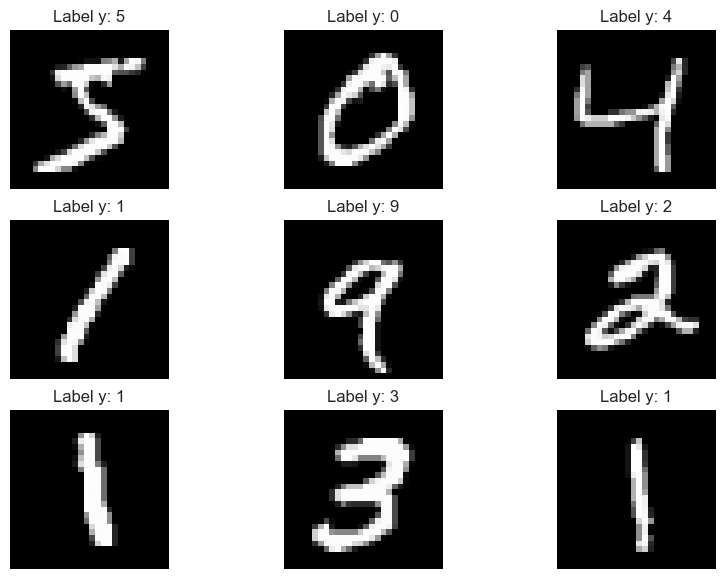

In [6]:
fig = plt.figure(figsize=(10, 7))
for i in range(9):
  ax = fig.add_subplot(3, 3, i + 1)
  ax.imshow(X_train[i], cmap=plt.get_cmap('gray'))
  ax.set_title(f'Label y: {y_train[i]}')
  plt.axis('off')

Flatten each input image into a vector of length 784

In [7]:
X_train = X_train.reshape(X_train.shape[0], 28*28)
X_test = X_test.reshape(X_test.shape[0], 28*28)

### Normalizing

In [8]:
from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()
X_train = mms.fit_transform(X_train)
X_test = mms.transform(X_test)

In [9]:
X_train.shape ,y_train.shape ,X_test.shape ,y_test.shape

((60000, 784), (60000,), (10000, 784), (10000,))

Let us consider the first 10000 images in training dataset and first 2000 images in testing dataset.

In [10]:
X_train = X_train[0:10000, :]
y_train = y_train[0:10000]

X_test = X_test[0:2000, :]
y_test = y_test[0:2000]

### **Linear SVM for MNIST multiclass classification**

#### **Using Pipeline**

In [11]:
pipe_1 = Pipeline([('scaler', MinMaxScaler()),
                   ('classifier', SVC(kernel='linear', C=1))])

pipe_1.fit(X_train, y_train.ravel())

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('classifier', SVC(C=1, kernel='linear'))])

Evaluate the model using crossvalidation

In [12]:
accuracy = cross_val_score(pipe_1, X_train, y_train.ravel(), cv=3)
print('Training Accuracy : {:.4f}'.format(accuracy.mean()*100))

Training Accuracy : 91.3799


Visualizing the confusion matrix 

<Figure size 700x900 with 0 Axes>

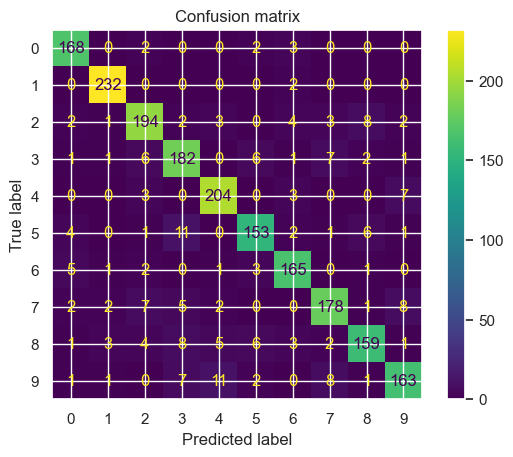

In [13]:
y_pred = pipe_1.predict(X_test)
plt.figure(figsize = (7,9))
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Confusion matrix')
plt.show()

Printing classification report 

In [14]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.91      0.96      0.94       175
           1       0.96      0.99      0.98       234
           2       0.89      0.89      0.89       219
           3       0.85      0.88      0.86       207
           4       0.90      0.94      0.92       217
           5       0.89      0.85      0.87       179
           6       0.90      0.93      0.91       178
           7       0.89      0.87      0.88       205
           8       0.89      0.83      0.86       192
           9       0.89      0.84      0.86       194

    accuracy                           0.90      2000
   macro avg       0.90      0.90      0.90      2000
weighted avg       0.90      0.90      0.90      2000



### **Nonlinear SVM for MNIST multiclass classification**

#### **Using Pipeline**

In [15]:
pipe_2 = Pipeline([('scalerr', MinMaxScaler()),
                   ('classifier', SVC(kernel='rbf', gamma=0.1, C=1))])

pipe_2.fit(X_train, y_train.ravel())

Pipeline(steps=[('scalerr', MinMaxScaler()),
                ('classifier', SVC(C=1, gamma=0.1))])

Evaluate the model using crossvalidation

In [16]:
accuracy = cross_val_score(pipe_2, X_train, y_train.ravel(), cv=2)
print('Training Accuracy : {:.4f}'.format(accuracy.mean()*100))

Training Accuracy : 82.8600


Visualizing the confusion matrix 

<Figure size 700x900 with 0 Axes>

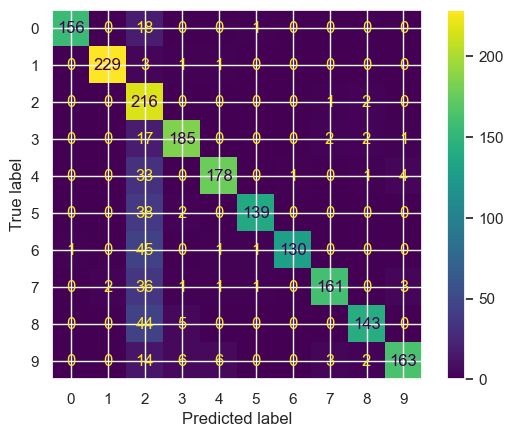

In [17]:
y_pred = pipe_2.predict(X_test)
plt.figure(figsize = (7,9))
ConfusionMatrixDisplay.from_predictions(y_test,y_pred)
plt.show()

Printing classification report 

In [18]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.99      0.89      0.94       175
           1       0.99      0.98      0.98       234
           2       0.47      0.99      0.63       219
           3       0.93      0.89      0.91       207
           4       0.95      0.82      0.88       217
           5       0.98      0.78      0.87       179
           6       0.99      0.73      0.84       178
           7       0.96      0.79      0.87       205
           8       0.95      0.74      0.84       192
           9       0.95      0.84      0.89       194

    accuracy                           0.85      2000
   macro avg       0.92      0.84      0.86      2000
weighted avg       0.91      0.85      0.86      2000



#### **Using GridSearchCV**

We can use a grid search cross-validation to explore combinations of parameters. 

Here we will adjust `C` (which controls the margin hardness) and `gamma` (which controls the size of the radial basis function kernel), and determines the best models.

In [19]:
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

In [20]:
C_range = np.logspace(-2, 10, 13)
gamma_range = np.logspace(-9, 3, 13)
param_grid = dict(gamma=gamma_range, C=C_range)

cv = StratifiedShuffleSplit(n_splits=3, test_size=0.2, random_state=42)

the below cell takes a very long amount of time to finish training (for me it took about 7 hrs)

In [ ]:
grid = GridSearchCV(SVC(kernel='rbf'), param_grid=param_grid, cv=cv)
grid.fit(X_train, y_train.ravel())

In [ ]:
grid.best_params_

In [ ]:
grid.best_score_

### How to view support vectors ?

- After the classifier is fit on the training data, there are few attributes which reveal the details of support vectors.

In [ ]:
from sklearn.svm import SVC
SvC_classifier = SVC()
clf = SvC_classifier.fit(X_train, y train)

#to view indices of the support vectors
clf.support_

#to view the support vectors
clf.support_vectors_

#to view the number of support vectors for each class
clf.n_support_

# `NuSVC`

### **How to implement `NuSVC` (ν-Support Vector Classification) ?**

Similar implementation as any other algorithm

- Instead of C in SVC, v is introduced in NuSVC to control the number of support vectors and margin errors.
- v is an upper bound on the fraction of margin errors and and a lower bound of the fraction of support vectors.

> Value of ν should ∈ (0, 1] (Default is 0.5)

Other parameters for NuSVC are same as that of SVC.

# `LinearSVC`

### How to implement LinearSVC (Linear Support Vector Classification)?

Implementation is similar as that of any other sklearn algorithm

#### Advantages of LinearSVC
- It has more flexibility in the choice of penalties and loss functions since it is implemented in terms of liblinear.
- Scales better to large numbers of samples.
- Supports both dense and sparse input.

Parameters are : 
1. `penalty` : 
	* l1  (l1 - leads to `coef_` vectors that are sparse.)
    * l2 (default)

2. `loss` :
	* `hinge` - standard SVM loss
    * `squared_hinge` - square of the hinge loss (default)
> Combination not supported: 
`penalty=l1` and `loss=hinge`

3. `C` : Regularization parameter

4. `dual` : Select the algorithm to either solve the dual or primal optimization problem. When n_samples >n_features, prefer dual=False.

5. `fit_intercept` : To calculate the intercept for the model.




### How to perform multi-class classification using SVM ?

- SVC and NuSVC implement the “one-versus-one” approach for multi-class classification.
We have a parameter called `decision_function_shape` which takes two inputs 
	- `ovo`
    - `ovr`
<br><br>
- LinearSVC implements “one-vs-the-rest” approach for multi-class classification.
We have parameter called `multi_class` which takes values - 
	- `ovr`
    - `crammer_singer`